ΟΜΑΔΑ 8 

ΦΑΡΔΕΛΑΣ ΙΩΑΝΝΗΣ 03113190 

ΠΑΡΑΛΙΚΑΣ ΗΛΙΑΣ  03116605

ΑΛΕΞΑΝΔΡΟΣ ΚΑΦΟΥΡΟΣ  03116741

##Κάνουμε τα imports


In [ ]:
import tensorflow as tf

import matplotlib.pyplot as plt

import collections
import random
import numpy as np
import joblib

import os
import time
import json
from PIL import Image
import keras
import pickle


from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


# HYPER PARAMETERS

Εδώ έχουμε ορίσει κάποιες παραμέτρους ώστε να κάνομυε fine tuning το μοντέλο.

In [ ]:
min_caption_length = 10
max_caption_length = 35

glove_embedding_dim =300

BATCH_SIZE = 64
BUFFER_SIZE = 1000
units = 1024



# Download Images and Captions

Όπως στο tutorial/εκφώνηση κατεβάζουμε το dataset των εικονών/captions.

In [ ]:
image_zip = tf.keras.utils.get_file('flickr30k-images-ecemod.zip',

                                      cache_subdir=os.path.abspath('.'),

                                      origin='https://www.dropbox.com/s/efqe8131slq1zah/flickr30k-images-ecemod.zip?dl=1',

                                      extract=True)

os.remove(image_zip)

4376395776/4376381805 [==============================] - 90s 0us/step


In [ ]:
# Download train captions file
train_captions_file = tf.keras.utils.get_file('train_captions.csv',
                                           cache_subdir=os.path.abspath('.'),
                                           origin='https://www.dropbox.com/s/qqrsitwecf7fjd3/train_captions.csv?dl=1',
                                           extract=False)
# Download test files list
test_images_file = tf.keras.utils.get_file('test_images.csv',
                                           cache_subdir=os.path.abspath('.'),
                                           origin='https://www.dropbox.com/s/ahtgk6isemsqldf/test_images.csv?dl=1',
                                           extract=False)

40960/29242 [==========================================] - 0s 0us/step


# Process the data

Στην συνέχεια κάνουμε ένα basic preprocessing.

In [ ]:
import pandas as pd
train_data = pd.read_csv("train_captions.csv", sep='|', names=['image','captionNum','caption'], header=None)
train_data = train_data[:8000*5]
print(train_data.shape)

test_images = pd.read_csv("test_images.csv", sep='|',names=['image'] , header=None)
print(test_images.shape)


(40000, 3)
(2000, 1)


## Remove unwanted column

In [ ]:
train_data = train_data.drop(['captionNum'],axis=1)

In [ ]:
train_data

,image,caption
0,_1000070808.jpg,A little girl holds orange lilies while other...
1,_1000070808.jpg,A little girl at a wedding holds a bouquet of...
2,_1000070808.jpg,Young girl in orange dress holding orange flo...
3,_1000070808.jpg,a girl at a wedding holding some orange flowers
4,_1000070808.jpg,A girl holds a bouquet of flowers
...,...,...
39995,_217224734.jpg,A photographer snaps a photo of a woman weari...
39996,_217224734.jpg,A woman dressed in blue leaps into the water ...
39997,_217224734.jpg,A woman wearing a strapless blue dress jumps ...
39998,_217224734.jpg,She runs across the shore as the photographer...


## split the images and their respective captions 

Χωρίζουμε και οργανώνουμε το dataset ωστε να είναι συμβατό με του tutorial.

In [ ]:
train_captions= []
img_name_vector =[]
for caption in train_data.iterrows():
    if  len(caption[1][1].split(" ")) > min_caption_length and len(caption[1][1].split(" ")) < max_caption_length:
        train_captions.append('<start> ' + caption[1][1] + ' <end>')
        img_name_vector.append('image_dir/'+ caption[1][0])


In [ ]:
print(len(train_captions))

30270


<start>  A little girl holds orange lilies while others celebrate an occasion in a garden setting . <end>


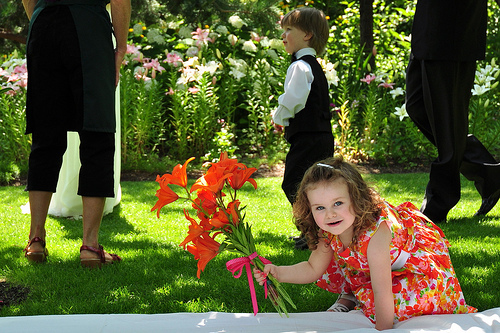

In [ ]:
print(train_captions[0])
Image.open(img_name_vector[0])

## preprocess images

In [ ]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.keras.layers.Resizing(331, 331)(img)
    img = tf.keras.applications.nasnet.preprocess_input(img)
    return img, image_path

## Download NASNet

Κατεβάζουμε το encoder που αντιστοιχεί  στην ομάδα μας, και κάνουμε extract τα features απο τις εικόνες.

In [ ]:
image_model = tf.keras.applications.nasnet.NASNetLarge(include_top=False,weights='imagenet')

new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

343621632/343610240 [==============================] - 5s 0us/step


In [ ]:
image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 331, 331, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv1 (Conv2D)            (None, 165, 165, 96  2592        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 165, 165, 96  384         ['stem_conv1[0][0]']             
                                )                                                             

In [ ]:
!pip install tqdm

from tqdm import tqdm

## Extract features from images

In [ ]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())


100%|██████████| 498/498 [10:22<00:00,  1.25s/it]


## preprocess captions , lowercase, remove special characters

In [ ]:
# prepare translation table for removing punctuation
table = str.maketrans('', '', "!\"#$%&\(\)\*\+.,-/:;=?@\[\\\]^_`{|}~")
for i,caption in enumerate(train_captions):
    # tokenize
    caption = caption.split()
    # convert to lower case
    caption = [word.lower() for word in caption]
    # remove punctuation from each token
    caption = [w.translate(table) for w in caption]
    # remove hanging 's' and 'a'
    #caption = [word for word in caption if len(word)>1]
    # remove tokens with numbers in them
    #caption = [word for word in caption if word.isalpha()]
    # store as string
    train_captions[i] =  ' '.join(caption)

## Create Vocabulary

Μετά απο δοκιμές διαφόρων μεγεθών vocabulary , καταλήξαμε σε ένα μεγαλυτερο vocabulary_size=10000( διπλάσσιο απο του tutorial) καθώς παρατηρήσαμε καλύτερα αποτελέσματα στα παραγώμενα captions και στο bleu score.

In [ ]:
caption_dataset = tf.data.Dataset.from_tensor_slices(train_captions)

# We will override the default standardization of TextVectorization to preserve
# "<>" characters, so we preserve the tokens for the <start> and <end>.
def standardize(inputs):
  inputs = tf.strings.lower(inputs)
  return tf.strings.regex_replace(inputs,
                                  r"!\"#$%&\(\)\*\+.,-/:;=?@\[\\\]^_`{|}~", "")

vocabulary_size = 10000
tokenizer = tf.keras.layers.TextVectorization(
    max_tokens=vocabulary_size,
    standardize=standardize,
    output_sequence_length=max_caption_length)
# Learn the vocabulary from the caption data.
tokenizer.adapt(caption_dataset)

In [ ]:
# Create the tokenized vectors
cap_vector = caption_dataset.map(lambda x: tokenizer(x))

In [ ]:
# Create mappings for words to indices and indicies to words.
word_to_index = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary())
index_to_word = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary(),
    invert=True)

## create embeding matrix

Κατεβάζουμε το glove από το οποίο επιλέξαμε το glove300 καθώς είδαμε βελτίωση απο το 100αρι τουλάχιστον σε ποιότητα παραγόμενων captions

In [ ]:
!wget http://nlp.stanford.edu/data/glove.6B.zip

--2022-03-09 15:35:59--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2022-03-09 15:35:59--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2022-03-09 15:36:00--  http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glove.6

In [ ]:
!unzip glove*.zip

Archive:  glove.6B.zip
  inflating: glove.6B.50d.txt        
  inflating: glove.6B.100d.txt       
  inflating: glove.6B.200d.txt       
  inflating: glove.6B.300d.txt       


In [ ]:
!ls

drive		   glove.6B.300d.txt  image_dir        train_captions.csv
glove.6B.100d.txt  glove.6B.50d.txt   sample_data
glove.6B.200d.txt  glove.6B.zip       test_images.csv


In [ ]:
path_to_glove_file = os.path.join( "glove.6B."+str(glove_embedding_dim)+ "d.txt")

embeddings_index = {}
with open(path_to_glove_file) as f:
    for line in f:
        word, coefs = line.split(maxsplit=1)
        coefs = np.fromstring(coefs, "f", sep=" ")
        embeddings_index[word] = coefs

print("Found %s word vectors." % len(embeddings_index))


Found 400000 word vectors.


In [ ]:
voc = tokenizer.get_vocabulary()
word_index = dict(zip(voc, range(len(voc))))


In [ ]:
num_tokens = len(voc) + 2
glove_embedding_dim = len(embeddings_index['word'])
hits = 0
misses = 0

# Prepare embedding matrix
embedding_matrix = np.zeros((num_tokens, glove_embedding_dim))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in embedding index will be all-zeros.
        # This includes the representation for "padding" and "OOV"
        embedding_matrix[i] = embedding_vector
        hits += 1
    else:
        misses += 1
print("Converted %d words (%d misses)" % (hits, misses))


Converted 9354 words (646 misses)


In [ ]:
from tensorflow.keras.layers import Embedding

embedding_layer = Embedding(
    num_tokens,
    glove_embedding_dim,
    embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix),
    trainable=False,
)


## Split into train & Validation

Χωρίζουμε το dataset σε train και τεστ οπως στο tutorial.

In [ ]:
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
  img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
  capt_len = len(img_to_cap_vector[imgt])
  img_name_train.extend([imgt] * capt_len)
  cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
  capv_len = len(img_to_cap_vector[imgv])
  img_name_val.extend([imgv] * capv_len)
  cap_val.extend(img_to_cap_vector[imgv])


In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)


(24238, 24238, 6032, 6032)

# Model

## create dataset

Φέρνουμε το dataset στην μορφη που το περιμένει το μοντέλο (και σύμφωνα με το NASnetLarge)

In [ ]:
# Feel free to change these parameters according to your system's configuration

num_steps = len(img_name_train) // BATCH_SIZE

# These two variables represent that vector shape
features_shape = 4032
attention_features_shape = 121


In [ ]:
# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap


In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int64]),
          num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)


## Attention

Χρησιμοποιούμε το visual attention του tutorial .

In [ ]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, glove_embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights


## Encoder

In [ ]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, glove_embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, glove_embedding_dim)
        self.fc = tf.keras.layers.Dense(glove_embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x


## Decoder

 Περναμε τα pretrained glove embemdings ως layer στο RNNdecoder. Δοκιμάσαμε και LSTM χωρίς ωστόσο καλύτερα αποτελέσματα.

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, glove_embedding_dim, units, vocab_size,LSTM=False):
    super(RNN_Decoder, self).__init__()
    self.units = units
    self.LSTM = LSTM
    
    self.embedding = tf.keras.layers.Embedding(
    num_tokens,
    glove_embedding_dim,
    embeddings_initializer=keras.initializers.Constant(embedding_matrix),
    trainable=False,
    )
    #self.embedding = tf.keras.layers.Embedding(vocab_size, glove_embedding_dim)
    
    if LSTM:
      self.lstm = tf.keras.layers.LSTM(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')

    else:
      self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, glove_embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, glove_embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    if self.LSTM:
      output, state, _ = self.lstm(x)
    else:
      output, state = self.gru(x)

    # shape == (batch_size, max_caption_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_caption_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_caption_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [ ]:
encoder = CNN_Encoder(glove_embedding_dim)
decoder = RNN_Decoder(glove_embedding_dim, units, tokenizer.vocabulary_size(),LSTM =False)


## Training

Στην συνέχεια κάνουμε train το model μας αποθηκεύοντας τα checkpoint των επαναληψεων στο google drive, προσπαθώντας να έχουμε όσο το δυνατό μικρότερο loss. Σε σύνολο έχουμε τρέξει περίπου 40 epochs  προκειμένου να ρίξουμε το loss στο 0.25. Ωστόσο αντιμετωπίσαμε προβλήματα όταν loadarame τα checkpoints, με αποτέλεσμα να χάνουμε κάποιο Loss και απο εκεί που ήταν στο 0.25 κάθε καινουργια συνεδρία να ξαναξεκιναγαμε απο μία μεγαλύτερη τιμή περίπου 0.6.

In [ ]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')


def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)


In [ ]:
checkpoint_path = "./drive/MyDrive/gdrive/MyDrive/NEURAL/thirdb"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=50)


In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)


In [ ]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []


### train step

In [ ]:
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([word_to_index('<start>')] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss


In [ ]:
start_epoch=40
EPOCHS=41
for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
      ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')


Epoch 41 Batch 0 Loss 0.3141
Epoch 41 Batch 100 Loss 0.3894
Epoch 41 Batch 200 Loss 0.4333
Epoch 41 Batch 300 Loss 0.6447
Epoch 41 Loss 0.426976
Time taken for 1 epoch 422.50 sec



Εξαιτίας της χρήσης checkpoints και της εκπαίδευσης μεταξύ συνεδριών το loss plot διαγραμμα, δεν έβγαινε σωστά αφού φορτώσουμε τα checkpoint το google drive.

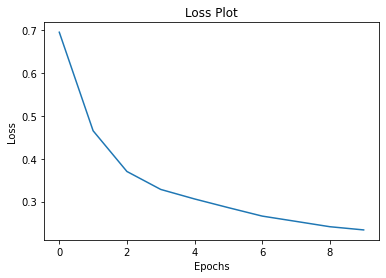

In [ ]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Χρησιμοποιούμε τις συανρτήσεις παραγωγής captions του tutorial και δοκιμάζουμε το εκπαιδευμένο μοντέλο μας.

In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_caption_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0],
                                                 -1,
                                                 img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([word_to_index('<start>')], 0)
    result = []

    for i in range(max_caption_length):
        predictions, hidden, attention_weights = decoder(dec_input,
                                                         features,
                                                         hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        predicted_word = tf.compat.as_text(index_to_word(predicted_id).numpy())
        

        if predicted_word == '<end>':
            return result, attention_plot
        result.append(predicted_word)
        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [ ]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for i in range(len_result):
        temp_att = np.resize(attention_plot[i], (8, 8))
        grid_size = max(int(np.ceil(len_result/2)), 2)
        ax = fig.add_subplot(grid_size, grid_size, i+1)
        ax.set_title(result[i])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

Παρουσιάζουμε κάποια παραδείγματα απο captions που παραγονται.

Real Caption: <start> a boy is surfing towards the beach on a green surfboard <end>
Prediction Caption: a boy is surfing on a bright blue waves during from the beach


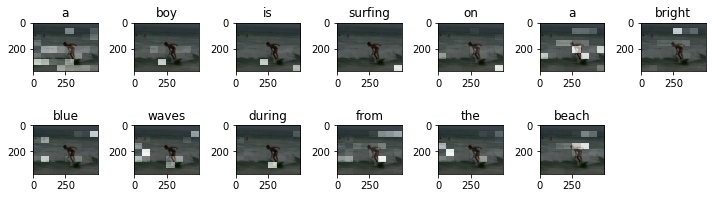

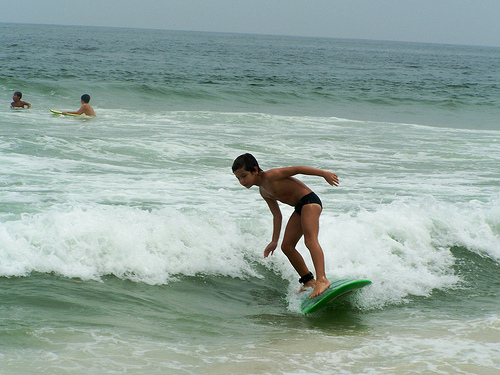

In [ ]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

Image.open(image)

Real Caption: <start> a brown dog running with two white and brown dogs on the seashore with crashing waves behind them <end>
Prediction Caption: two tan dogs run in the ocean


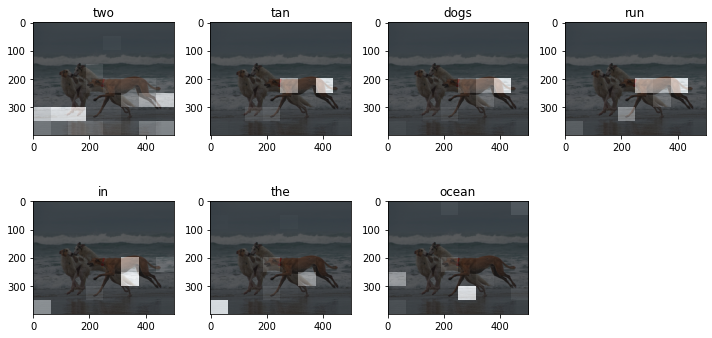

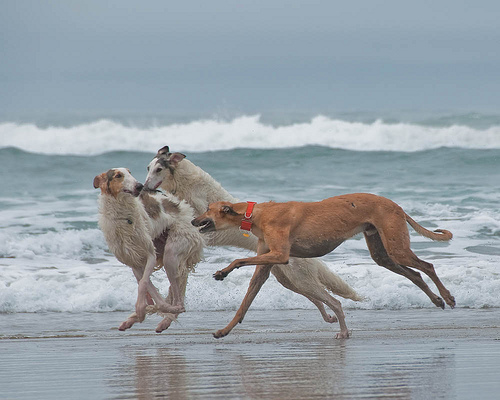

In [ ]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

Image.open(image)

Real Caption: <start> three white men in tshirt jump into the air <end>
Prediction Caption: three male saxophone player is jumping onto the air


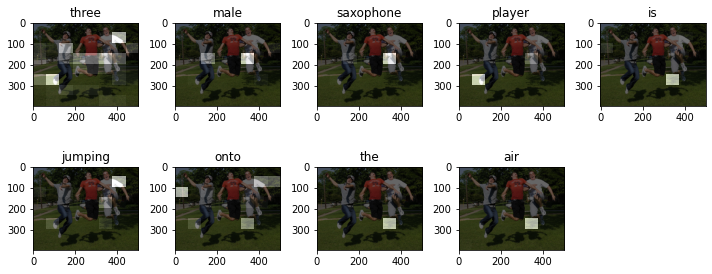

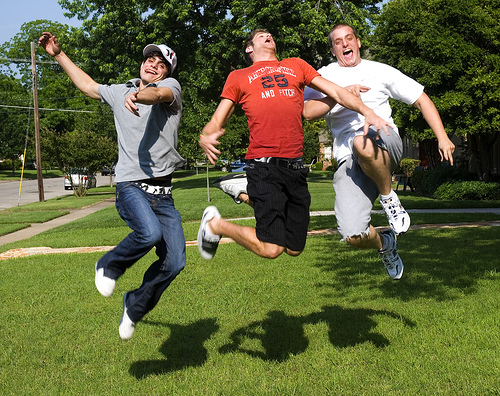

In [ ]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

Image.open(image)

Real Caption: <start> a man sits on a stool in front of a shop <end>
Prediction Caption: man sitting on a brick wooden chair outside a store


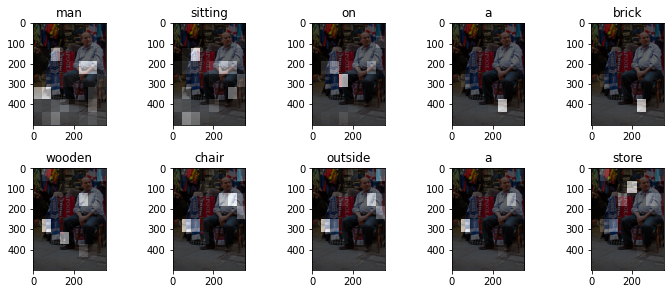

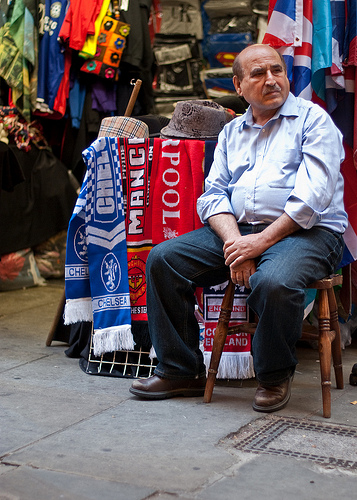

In [ ]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

Image.open(image)

# Caption Evaluation

Στην συνέχεια αν και με μικρή επιτυχία δοκιμάζουμε να εφαρμόσουμε μια συνάρτηση beam search προκείμένου να έχουμε καλύτερα αποτελέσματα. Δυστυχώς δεν καταφέραμε να έχουμε αξιόλογα αποτελέσματα , περισσότερο κάτι που έμοιαζε με τυχαία παραγωγη φράσεων.

In [ ]:
from keras.preprocessing.text import Tokenizer

In [ ]:

caption_train_tokenizer = Tokenizer() #initialize tokenizer
caption_train_tokenizer.fit_on_texts(train_captions) #fit tokenizer on training data

In [ ]:
def tokenize_caption(top_k,train_captions):
  
  # Choose the top 5000 words from the vocabulary
  top_k=10000

  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                    oov_token="<unk>",
                                                    filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
  tokenizer.fit_on_texts(train_captions)
  train_seqs = tokenizer.texts_to_sequences(train_captions)
  # Map '<pad>' to '0'
  tokenizer.word_index['<start>'] = 0
  tokenizer.index_word[0] = '<start>'
  tokenizer.word_index['<end>'] = 1
  tokenizer.index_word[1] = '<end>'
  # Create the tokenized vectors
  train_seqs = tokenizer.texts_to_sequences(train_captions)
  return train_seqs, tokenizer

In [ ]:

def beam_evaluate(image, encoder,decoder, beam_index =3):
    
    top_k =10000
    train_seqs , tokenizer = tokenize_caption(top_k ,train_captions)
    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_caption_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
#ekanaallagi
    while len(result[0][0]) < max_caption_length :
        i=0
        temp = []
        for s in result:
            

            predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

            attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
            i=i+1
          # Getting the top <beam_index>(n) predictions
            word_preds = np.argsort(predictions[0])[-beam_index:]
           # creating a new list so as to put them via the model again
            for w in word_preds:       
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                prob += predictions[0][w]
                temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
            dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
            break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break
    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    final_caption = final_caption.split(' ')
    return final_caption,attention_plot


Παρουσιάζουμε εικώνες και τα captions που παράγουν πρώτα το beam search και στην συνέχεια η συνάρτηση του tutorial. Το beam search φαίνεται να κολλάει σε loopες που παραγουν επαναλαμβανόμενες λέξεις μέχρι να γεμίσει το max_caption_length ή να παραγει μισές η πολυ μικρές προτάσεις.

Real Caption: <start> a class of students works on arts and crafts <end>
Prediction Caption: a group of working talking looking pictures


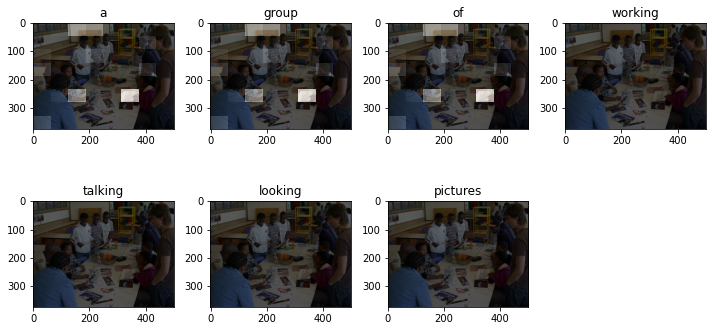

Real Caption: <start> a class of students works on arts and crafts <end>
Prediction Caption: a class of students surrounding a table looking at many pictures


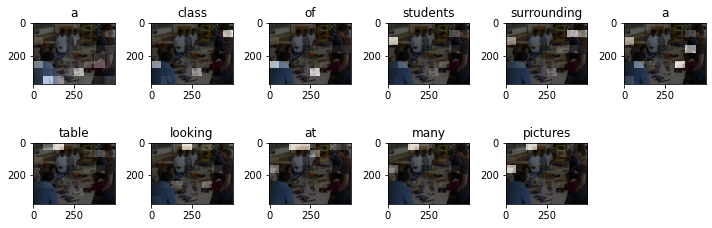

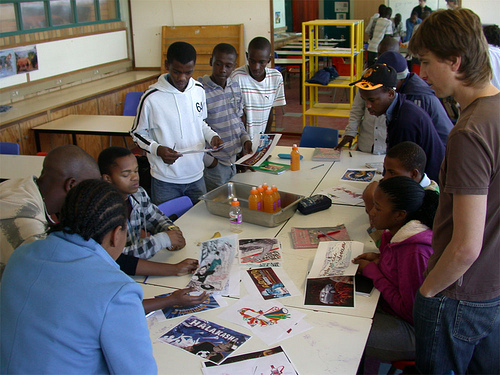

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> a young boy throwing a rock into a pond in front of a large building <end>
Prediction Caption: a boy in front of a blue with a blue jeans standing on front of a blue with a blue jeans standing on front of a blue with a blue jeans standing on front


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


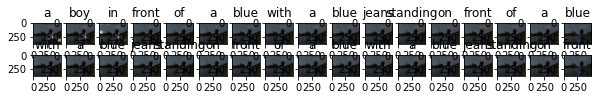

Real Caption: <start> a young boy throwing a rock into a pond in front of a large building <end>
Prediction Caption: a boy walking next to a big building


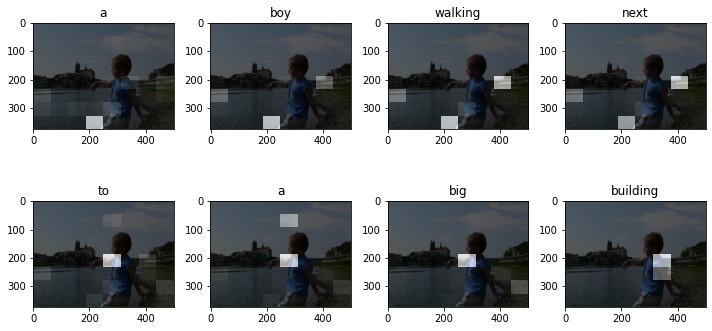

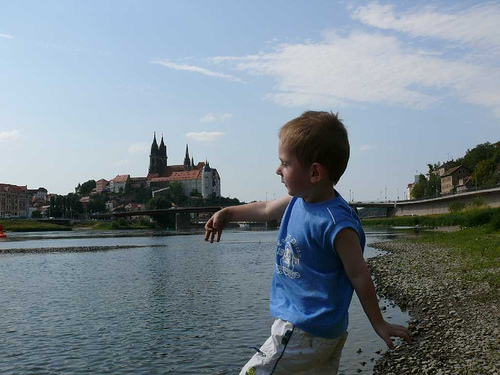

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> a man is socializing with another man in the bar <end>
Prediction Caption: two men flowers sitting at a bar


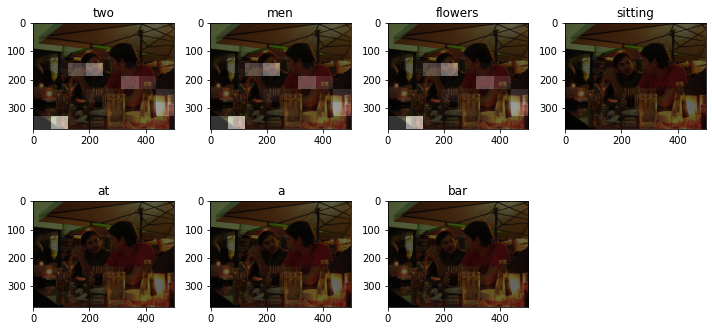

Real Caption: <start> a man is socializing with another man in the bar <end>
Prediction Caption: two men one man are sitting at a bar


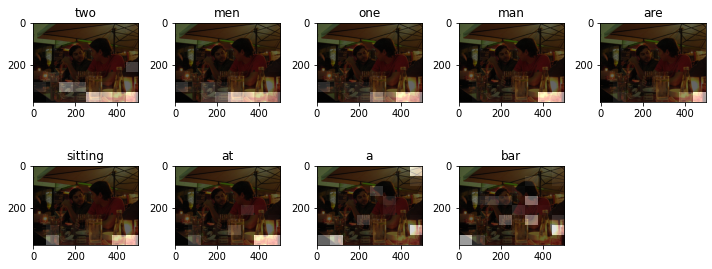

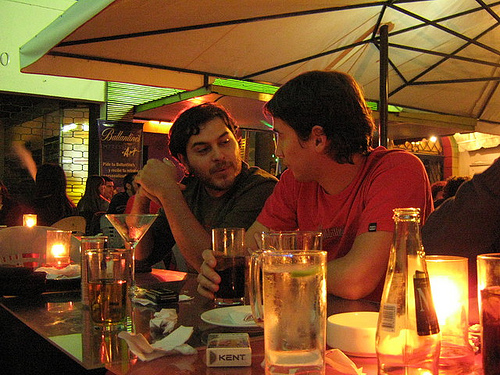

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> brown and black horse jumping while person in blue outfit and white cowboy hat lays on the ground <end>
Prediction Caption: a swing is the horse shirt is cape a black shirt hat and in sand of his horse while


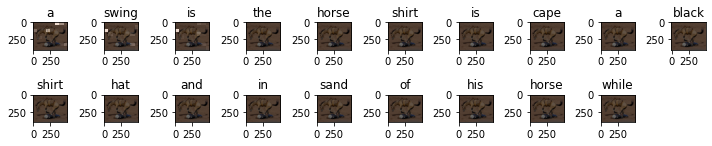

Real Caption: <start> brown and black horse jumping while person in blue outfit and white cowboy hat lays on the ground <end>
Prediction Caption: a man is jumping a horse at a horse at a bull


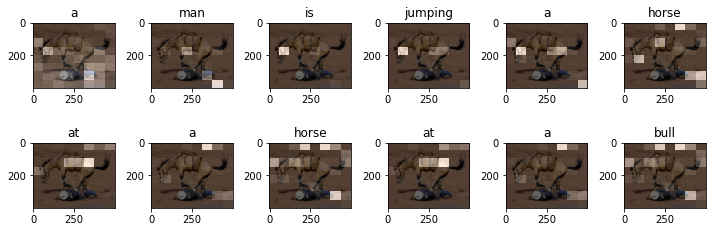

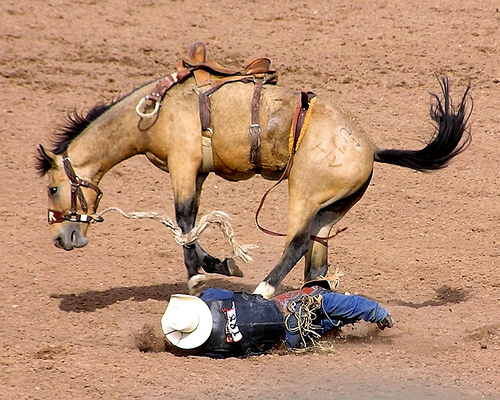

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> there is a big dog looking at a little dog <end>
Prediction Caption: a dog dog in the blond wooden brown dog in the blond wooden brown dog in the blond wooden brown dog in the blond wooden brown dog in the blond wooden brown dog in


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


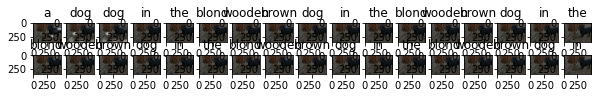

Real Caption: <start> there is a big dog looking at a little dog <end>
Prediction Caption: a big black dog is standing in the long grass


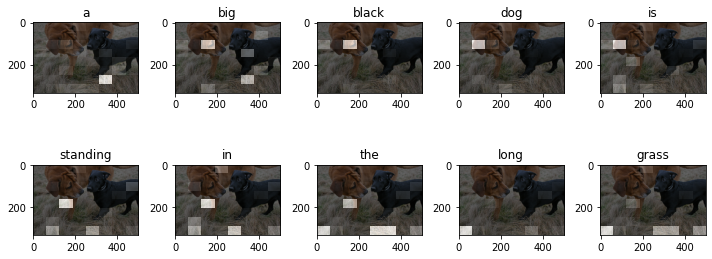

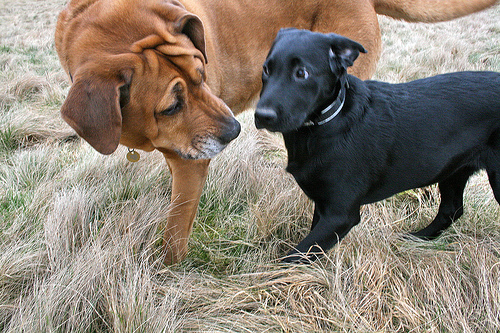

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> an older gentleman with face paint is playing the violin <end>
Prediction Caption: man mechanic hat and hat and hat and hat and hat and hat and hat and hat and hat and hat and hat and hat and hat and hat and hat and hat and


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


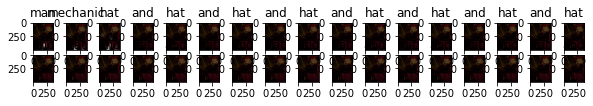

Real Caption: <start> an older gentleman with face paint is playing the violin <end>
Prediction Caption: a masked man is performing


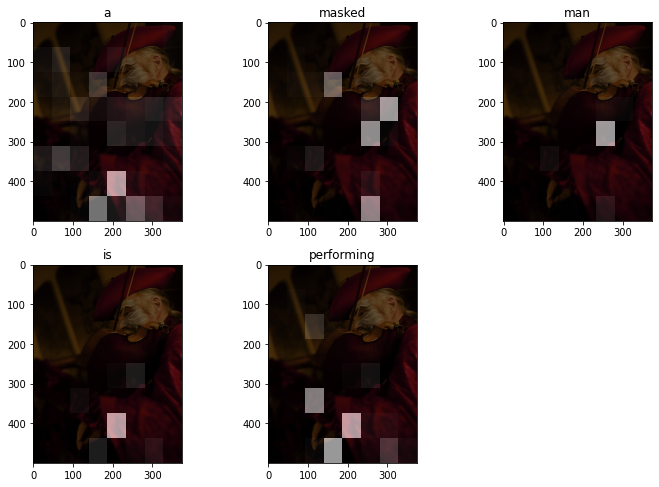

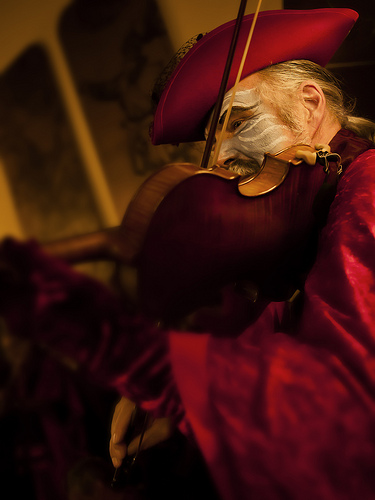

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> a girl wearing a pink hoodie looks through her camera <end>
Prediction Caption: a pink sitting behind to net cut while it piece a gray holds a pink standing through her camera


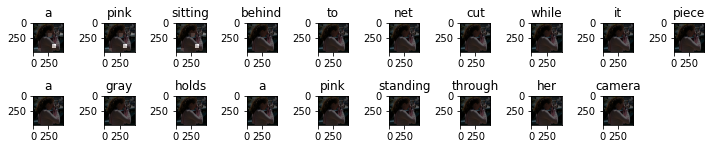

Real Caption: <start> a girl wearing a pink hoodie looks through her camera <end>
Prediction Caption: a young woman wearing a pink hoodie takes a picture


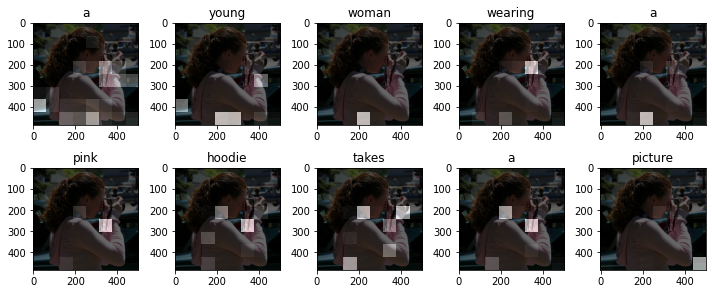

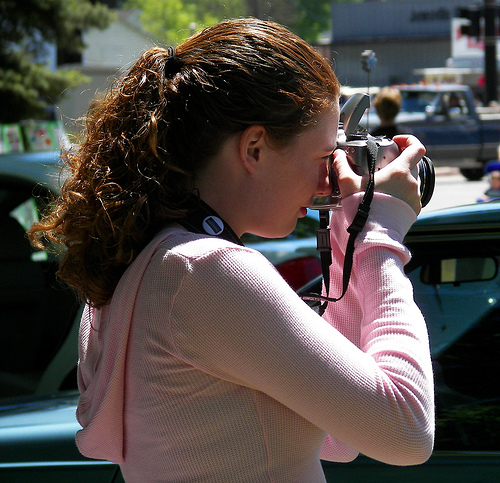

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> a man in a red jacket and white apron stands in front of a brightly painted wall with yellow lettering <end>
Prediction Caption: a white cigarette


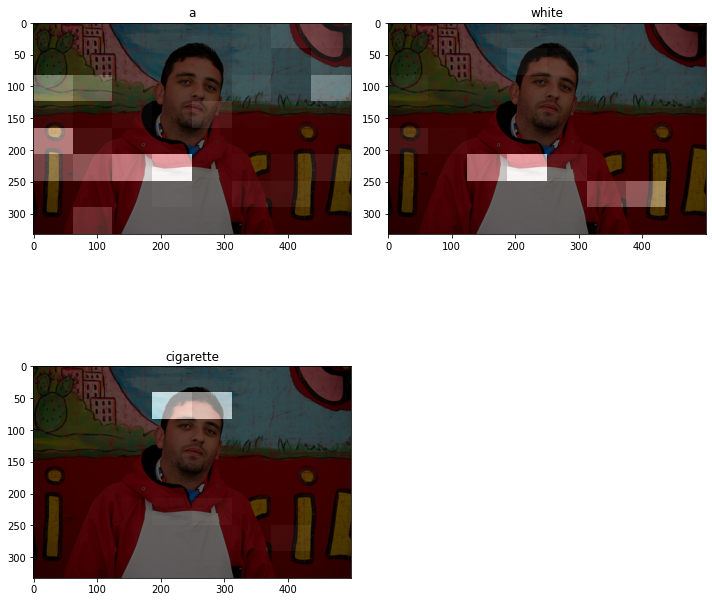

Real Caption: <start> a man in a red jacket and white apron stands in front of a brightly painted wall with yellow lettering <end>
Prediction Caption: a man wearing an apron is leaning against a mural


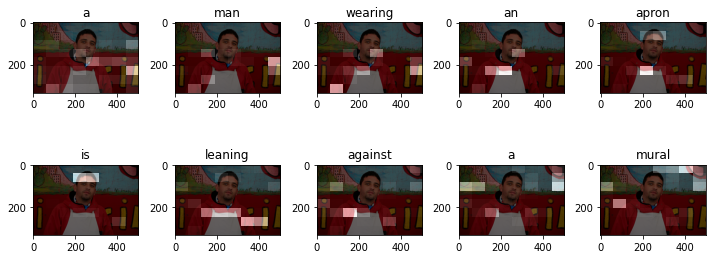

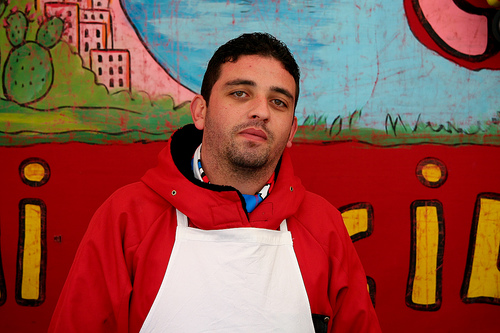

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> a man is standing up while a woman in purple pants sits down as he does her hair <end>
Prediction Caption: a man in the players looking a players looking a players looking a players looking a players looking a players looking a players looking a players looking a players looking a players on a


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


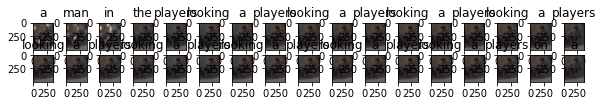

Real Caption: <start> a man is standing up while a woman in purple pants sits down as he does her hair <end>
Prediction Caption: a man in a green shirt stands beside her


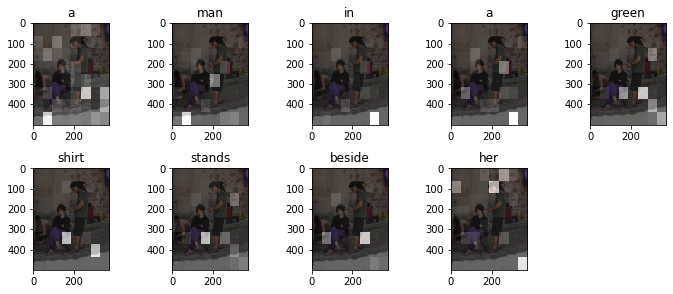

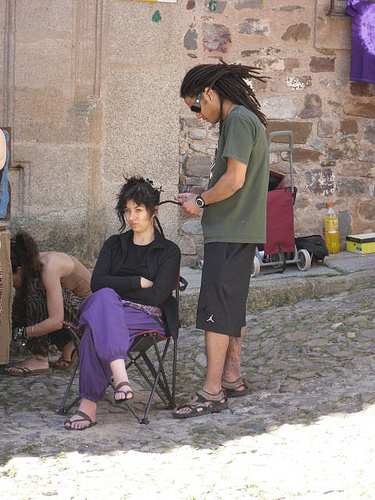

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> an immigrant stands outside of a laundromat in the city <end>
Prediction Caption: a woman in a texts stage a red and a red and a red and a red and a red and a red and a red and a red and a red and a


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


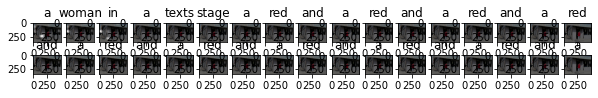

Real Caption: <start> an immigrant stands outside of a laundromat in the city <end>
Prediction Caption: a man in a red plaid stand in the doorway of a laundry mat


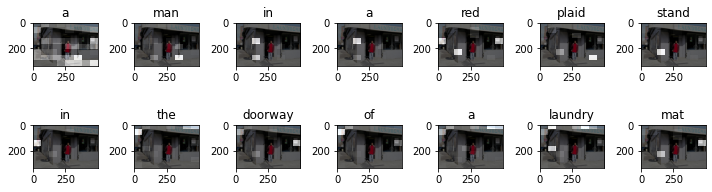

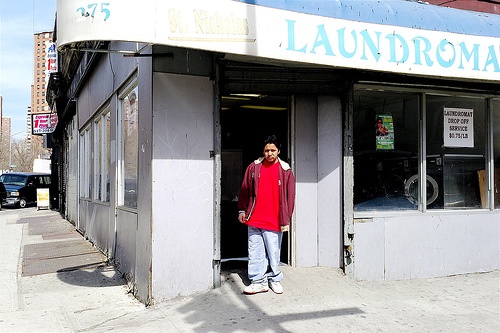

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> two people sit side by side up against a tree <end>
Prediction Caption: two woman wearing a black beer against a grass and green jean green pink beside cap and a baseball and peace and a pink and peace and a pink and cap and a black


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


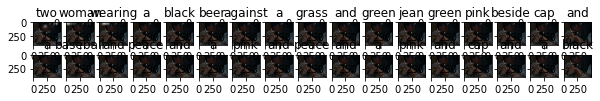

Real Caption: <start> two people sit side by side up against a tree <end>
Prediction Caption: a man and woman smiling while a man and a beard and a hat leans over faces


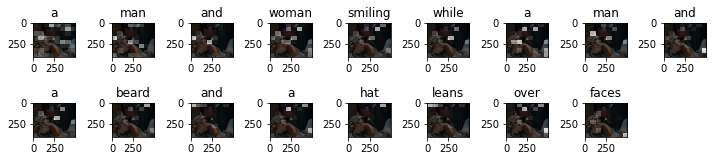

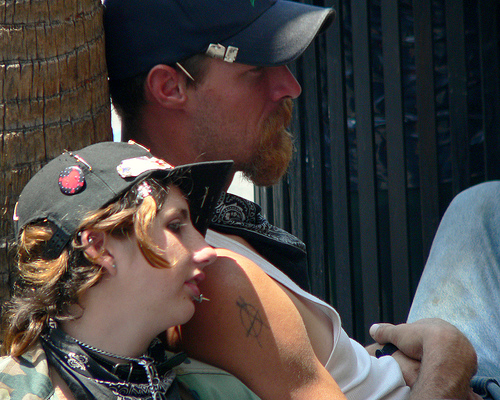

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> three african american males and one elderly female are playing dominoes at a square table <end>
Prediction Caption: three young in their table game airman game game airman


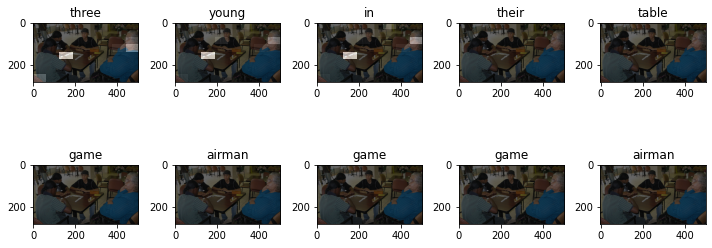

Real Caption: <start> three african american males and one elderly female are playing dominoes at a square table <end>
Prediction Caption: three young men are sitting at a table playing dominoes


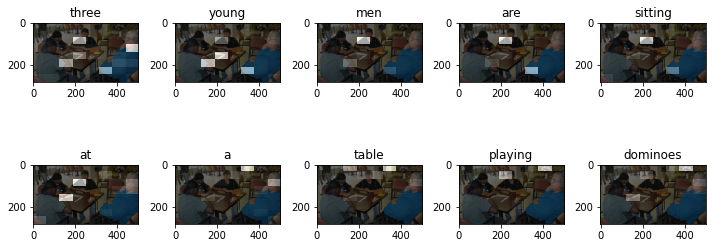

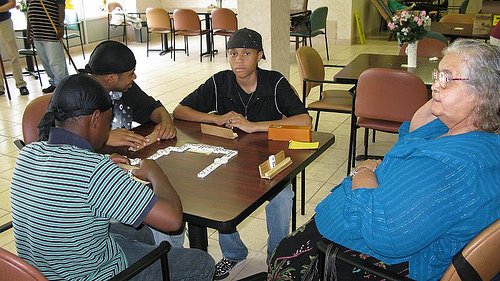

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> a gloved worker sets fresh food into the steam table of a buffet line <end>
Prediction Caption: a man is catching their near her back into the nuts


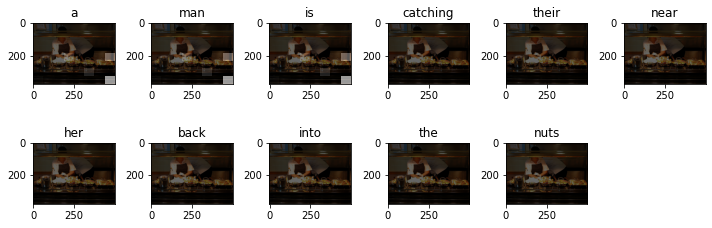

Real Caption: <start> a gloved worker sets fresh food into the steam table of a buffet line <end>
Prediction Caption: a woman in an apron stands behind a counter with several pans of food on it and someone else stands bent ramp


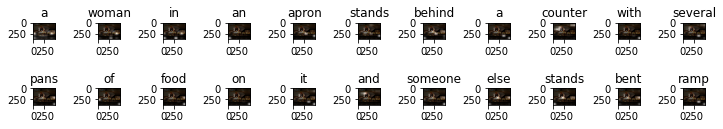

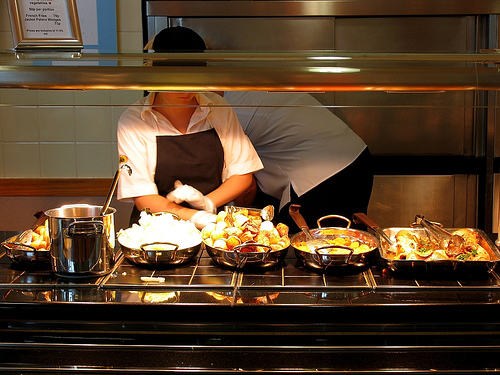

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> a dirt biker soars above green trees with a blue slightly cloudy sky in the background <end>
Prediction Caption: an person on his mouth down blowing a red and white outfit rides jumping over a midair and white outfit rides jumping over a midair and white outfit rides jumping off a red and


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


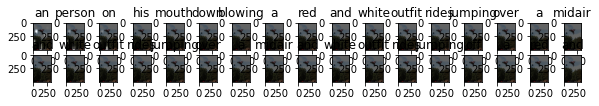

Real Caption: <start> a dirt biker soars above green trees with a blue slightly cloudy sky in the background <end>
Prediction Caption: somebody riding a red bike with onlookers


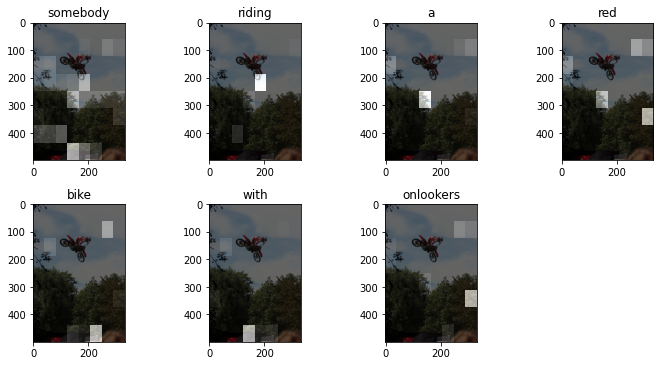

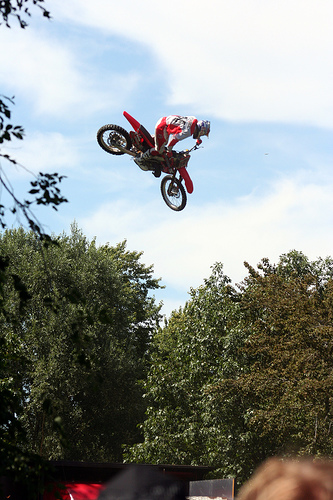

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> a woman crosses the street with a baby in her arms <end>
Prediction Caption: a woman runners on a of the road lot


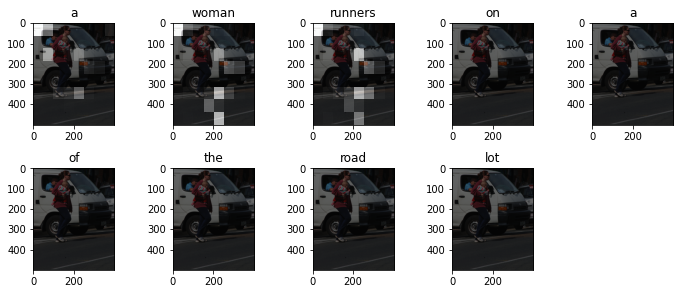

Real Caption: <start> a woman crosses the street with a baby in her arms <end>
Prediction Caption: a woman crosses the street with a toddler in the midst of traffic looks at him in a dumpster


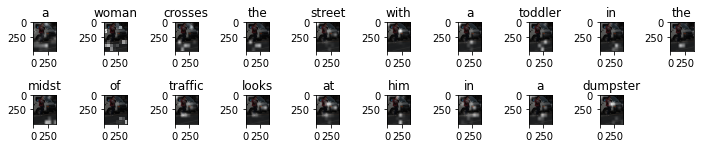

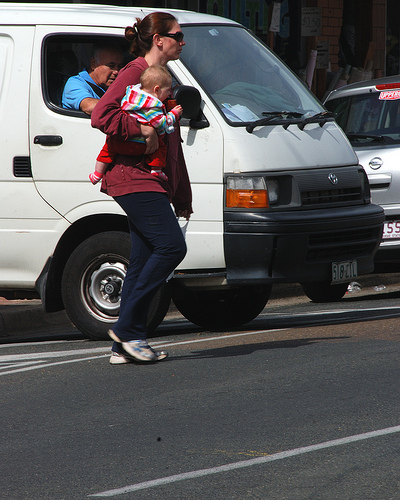

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

Real Caption: <start> a baby is sitting on a floor and holding a vacuum cleaner hose <end>
Prediction Caption: a baby players


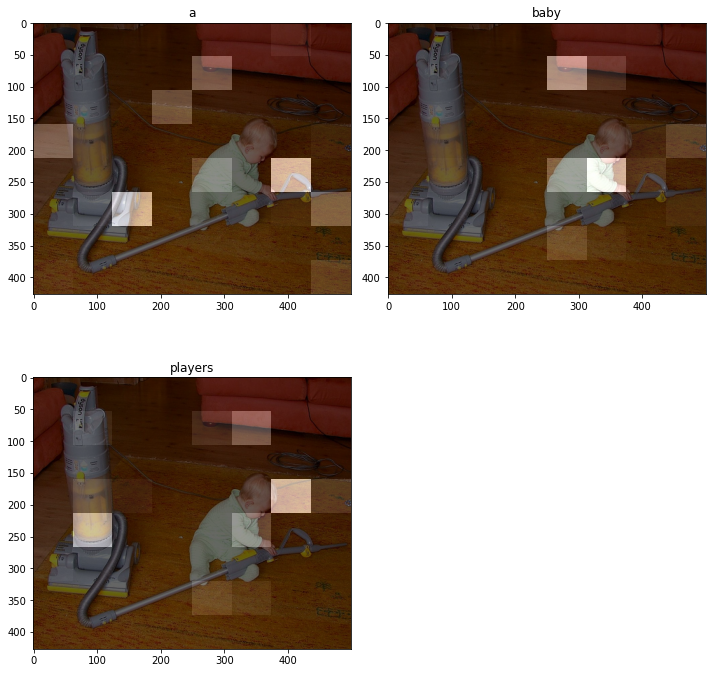

Real Caption: <start> a baby is sitting on a floor and holding a vacuum cleaner hose <end>
Prediction Caption: a baby boy watches


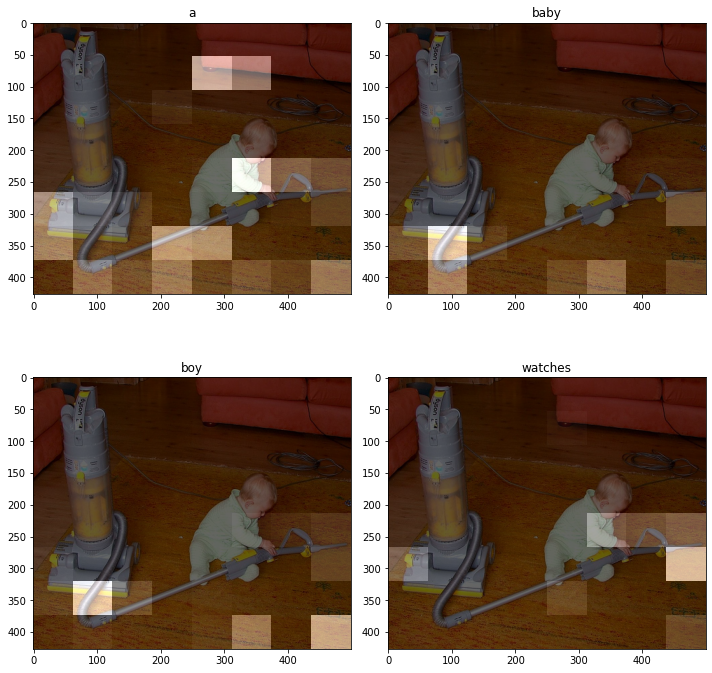

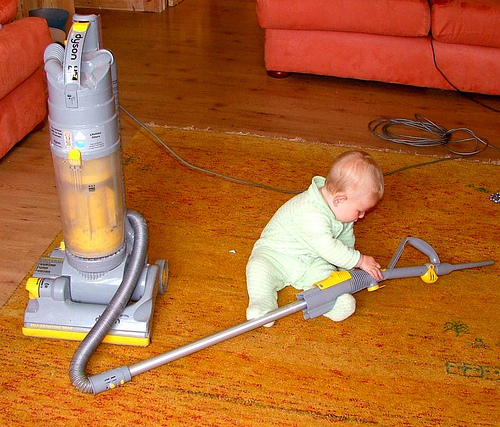

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot =beam_evaluate(image,encoder,decoder,beam_index=3)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Image.open(image)

# BLEU

Στην συνέχεια παρουσιάζουμε τα bleu score των δύο αυτών συναρτήσεων

In [ ]:
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate.bleu_score import SmoothingFunction


In [ ]:
#counter = 0 
#for image in img_name_val_keys:
   #captions_for_image =[]
   #while image == img_name_val[counter]:

     #real_caption = ' '.join([tf.compat.as_text(index_to_word(counter).numpy())
                         # for counter in cap_val[counter] if counter not in [0]])
    
     #real_caption = real_caption.split(' ')
    # real_caption = real_caption[1:-1]
    # captions_for_image.append(real_caption)
     #counter += 1

  # list_of_references.append(captions_for_image)

In [ ]:
import pickle


list_of_references_file= "./drive/MyDrive/gdrive/MyDrive/NEURAL/third/list_of_references/list_of_references.pkl"


# with open(list_of_references_file, "wb") as output_file:
#   pickle.dump(list_of_references,output_file)


In [ ]:
!ls "./drive/MyDrive/gdrive/MyDrive/NEURAL/third/list_of_references/list_of_references.pkl"


./drive/MyDrive/gdrive/MyDrive/NEURAL/third/list_of_references/list_of_references.pkl


In [ ]:

with open(list_of_references_file, "rb") as input_file:
  list_of_references = pickle.load(input_file)

In [ ]:
hypotheses = []
for image in img_name_val_keys:
  result, _ = evaluate(image)
  hypotheses.append(result)
hypothesess = hypotheses[:-1]

In [ ]:


hypothesess_file= "./drive/MyDrive/gdrive/MyDrive/NEURAL/third/list_of_references/hypothesess.pkl"

infile = open(hypothesess_file,'rb')
best_model2 = pickle.load(infile)

with open(hypothesess_file, "wb") as output_file:
  pickle.load(hypothesess,output_file)

In [ ]:
bleu_score = corpus_bleu(list_of_references,hypothesess,(0.4, 0.3, 0.2, 0.1),SmoothingFunction().method1)
print(bleu_score)

0.04997301399792017


In [ ]:
beam_hypotheses = []
for image in img_name_val_keys:
  result, _ = beam_evaluate(image,encoder,decoder,beam_index=5)
  beam_hypotheses.append(result)


In [ ]:
#beam_hypothesess = beam_hypotheses[:-1]
beam_hypothesess_file= "./drive/MyDrive/gdrive/MyDrive/NEURAL/third/list_of_references/beam_hypothesess.pkl"


with open(beam_hypothesess_file, "wb") as output_file:
  pickle.dump(beam_hypotheses,output_file)

In [ ]:
beam_hypothesess = beam_hypotheses[:-1]

In [ ]:
beam_bleu_score = corpus_bleu(list_of_references,beam_hypothesess,(0.4, 0.3, 0.2, 0.1),SmoothingFunction().method1)
print(beam_bleu_score)

0.02220637998744158
